In [1]:
# !pip install diffusers transformers accelerate safetensors
# !pip install git+https://github.com/huggingface/diffusers.git

# pip install datasets scipy ftfy tensorboard

# pip install huggingface-hub
# !pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121
# !pip install diffusers
# !pip install pillow
# pip install bitsandbytes xformers
# !pip install peft
# pip install huggingface_hub[hf_xet]

In [17]:
# pip install matplolib

ERROR: Could not find a version that satisfies the requirement matplolib (from versions: none)
ERROR: No matching distribution found for matplolib
Note: you may need to restart the kernel to use updated packages.


In [1]:
import torch
from IPython.display import display
from diffusers import DiffusionPipeline, AutoencoderKL
from diffusers import StableDiffusionXLInpaintPipeline

from PIL import Image
import numpy as np


/anaconda/envs/azureml_py38/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-07-10 08:53:21.021762: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1752137601.042823   17662 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1752137601.049285   17662 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1752137601.065842   17662 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.


In [6]:
vae = AutoencoderKL.from_pretrained(
    "madebyollin/sdxl-vae-fp16-fix", 
    torch_dtype=torch.float16
)
pipe = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    vae=vae,
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True,
)
pipe.to("cuda");

Loading pipeline components...: 100%|██████████| 7/7 [00:02<00:00,  2.81it/s]


100%|██████████| 50/50 [00:35<00:00,  1.42it/s]


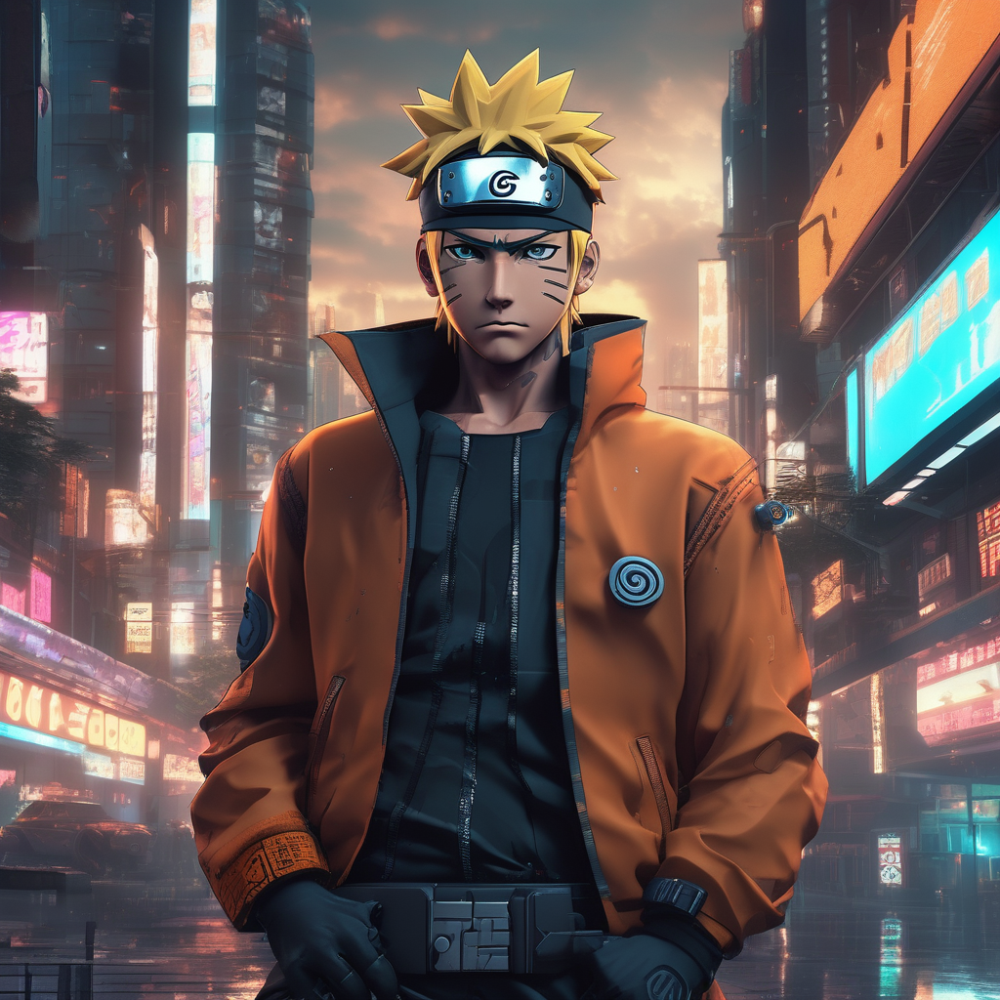

In [7]:
prompt = "Naruto in cyberpunk city ,detailed, Cinematic lighting, dynamic angle, ultra-detailed,ultra realistic, 85mm lens, soft bokeh, high contrast."
negative_prompt = "Distorted eyes,nose,ear,hand,fingers"
image = pipe(prompt=prompt,negative_prompt=negative_prompt).images[0]
display(image)

In [2]:
import torch
from IPython.display import display
from diffusers import DiffusionPipeline, AutoencoderKL
from diffusers import StableDiffusionXLInpaintPipeline
from diffusers import (
    StableDiffusionXLControlNetPipeline,
    ControlNetModel,
    AutoencoderKL,
    EulerDiscreteScheduler,
)

from PIL import Image
import numpy as np

Train on AC remote

In [1]:
!accelerate launch diffusers/examples/dreambooth/train_dreambooth_lora_sdxl.py \
  --pretrained_model_name_or_path="stabilityai/stable-diffusion-xl-base-1.0" \
  --instance_data_dir="ac-images" \
  --output_dir="./sdxl-lora-output" \
  --instance_prompt="a photo of acr product" \
  --resolution=1024 \
  --train_batch_size=1 \
  --gradient_accumulation_steps=2 \
  --learning_rate=1e-4 \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --max_train_steps=1000 \
  --mixed_precision="fp16" \
  --seed=42 \
  # --train_text_encoder\
  --use_8bit_adam\
  --gradient_checkpointing


ipex flag is deprecated, will be removed in Accelerate v1.10. From 2.7.0, PyTorch has all needed optimizations for Intel CPU and XPU.
The following values were not passed to `accelerate launch` and had defaults used instead:
	`--num_processes` was set to a value of `1`
	`--num_machines` was set to a value of `1`
	`--mixed_precision` was set to a value of `'no'`
	`--dynamo_backend` was set to a value of `'no'`
To avoid this warning pass in values for each of the problematic parameters or run `accelerate config`.
2025-07-13 13:54:47.445570: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1752414888.416555    3255 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1752414888.706378    3255 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attemp

In [3]:
from diffusers import StableDiffusionXLPipeline
import torch

# # ✅ Step 1: Load the base SDXL model
# pipe = StableDiffusionXLPipeline.from_pretrained(
#     "stabilityai/stable-diffusion-xl-base-1.0",
#     torch_dtype=torch.float16,
#     variant="fp16",
#     use_safetensors=True
# ).to("cuda")

pipe = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True
).to("cuda")

# pipe.load_lora_weights("./sdxl-lora-output")
pipe.load_lora_weights("./sdxl-lora-output-acr-v2")
pipe.enable_attention_slicing()

/anaconda/envs/azureml_py38/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-07-13 18:33:31.791925: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1752431611.812652   24673 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1752431611.819002   24673 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1752431611.835179   24673 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.


In [1]:
!accelerate launch diffusers/examples/dreambooth/train_dreambooth_lora_sdxl.py \
  --pretrained_model_name_or_path="stabilityai/stable-diffusion-xl-base-1.0" \
  --instance_data_dir="ac-images" \
  --output_dir="./sdxl-lora-output-acr-v2" \
  --instance_prompt="a photo of acr product" \
  --resolution=768 \
  --train_batch_size=1 \
  --gradient_accumulation_steps=2 \
  --learning_rate=1e-4 \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --max_train_steps=2000 \
  --mixed_precision="fp16" \
  --train_text_encoder \
  --seed=42 \
  --use_8bit_adam \
  --gradient_checkpointing

ipex flag is deprecated, will be removed in Accelerate v1.10. From 2.7.0, PyTorch has all needed optimizations for Intel CPU and XPU.
The following values were not passed to `accelerate launch` and had defaults used instead:
	`--num_processes` was set to a value of `1`
	`--num_machines` was set to a value of `1`
	`--mixed_precision` was set to a value of `'no'`
	`--dynamo_backend` was set to a value of `'no'`
To avoid this warning pass in values for each of the problematic parameters or run `accelerate config`.
2025-07-13 16:30:26.442780: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1752424226.462812   24929 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1752424226.469057   24929 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attemp

In [2]:
pipe.load_lora_weights("./sdxl-lora-output-acr-v2")

NameError: name 'pipe' is not defined

In [7]:
prompt = "a photo of acr product on the table inside a children playroom with a colorful background in high quality"
negative_prompt = " blurry, low resolution, out of frame, distorted, misshaped, less buttons, distorted logos, distorted text"

In [8]:
image = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    guidance_scale=7.5,
    num_inference_steps=45
).images[0]

100%|██████████| 45/45 [00:43<00:00,  1.02it/s]


In [9]:
image.save("acr_lora_result.png")
image.show()

/usr/bin/xdg-open: 882: www-browser: not found
/usr/bin/xdg-open: 882: links2: not found
/usr/bin/xdg-open: 882: elinks: not found
/usr/bin/xdg-open: 882: links: not found
/usr/bin/xdg-open: 882: lynx: not found
/usr/bin/xdg-open: 882: w3m: not found
xdg-open: no method available for opening '/tmp/tmppz_cggoy.PNG'


In [ ]:
!accelerate launch diffusers/examples/dreambooth/train_dreambooth_lora_sdxl.py \
  --pretrained_model_name_or_path="stabilityai/stable-diffusion-xl-base-1.0" \
  --instance_data_dir="training_images" \
  --output_dir="./sdxl-lora-output" \
  --instance_prompt="a photo of tpc product" \
  --resolution=512 \
  --train_batch_size=1 \
  --gradient_accumulation_steps=4 \
  --learning_rate=1e-4 \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --max_train_steps=1000 \
  --mixed_precision="fp16" \
  --seed=42 \
  --train_text_encoder

In [10]:
!accelerate launch diffusers/examples/dreambooth/train_dreambooth_lora_sdxl.py \
  --pretrained_model_name_or_path="stabilityai/stable-diffusion-xl-base-1.0" \
  --instance_data_dir="training_images" \
  --pretrained_vae_model_name_or_path="madebyollin/sdxl-vae-fp16-fix" \
  --output_dir="./sdxl-lora-output2" \
  --instance_prompt="a photo of tpc product" \
  --resolution=1024 \
  --train_batch_size=1 \
  --gradient_accumulation_steps=4 \
  --learning_rate=1e-4 \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --validation_prompt="a photo of tpc product on a shelf" \
  --validation_epochs=50\
  --max_train_steps=1000 \
  --mixed_precision="fp16" \
  --seed=42 \
  --train_text_encoder
 
 

/anaconda/envs/azureml_py38/lib/python3.10/site-packages/scipy/__init__.py:132: UserWarning: A NumPy version >=1.21.6 and <1.28.0 is required for this version of SciPy (detected version 2.2.6)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"

A module that was compiled using NumPy 1.x cannot be run in
NumPy 2.2.6 as it may crash. To support both 1.x and 2.x
versions of NumPy, modules must be compiled with NumPy 2.0.
Some module may need to rebuild instead e.g. with 'pybind11>=2.12'.

If you are a user of the module, the easiest solution will be to
downgrade to 'numpy<2' or try to upgrade the affected module.
We expect that some modules will need time to support NumPy 2.

Traceback (most recent call last):  File "/anaconda/envs/azureml_py38/bin/accelerate", line 5, in <module>
    from accelerate.commands.accelerate_cli import main
  File "/anaconda/envs/azureml_py38/lib/python3.10/site-packages/accelerate/commands/accelerate_cli.py", line 19, in <module>
    fr

In [2]:
!pip install opencv-python

In [2]:
!realpath train.png 

/mnt/batch/tasks/shared/LS_root/mounts/clusters/gpu-image-gen/code/Users/atharva.jakhetiya/train.png


In [3]:
# import cv2
# from PIL import Image
# import numpy as np
# import os

# # Absolute path to your imagefrom PIL import Image
# import numpy as np

# # Path to the input image
# img_path = "your_input_image.png"  # Replace with your actual image path

# # Load the image and convert to RGB
# original = Image.open(img_path).convert("RGB")
# img_np = np.array(original)

# # Threshold to determine if a pixel is white
# threshold = 240  # You can tweak this based on your image's background tone

# # Create a binary mask:
# # - White pixels (all RGB > threshold) → keep white (255)
# # - Other pixels (colored) → set to black (0)
# white_mask = np.all(img_np > threshold, axis=-1)
# mask = np.where(white_mask[..., None], 255, 0).astype(np.uint8)

# # Convert to grayscale image
# mask_img = Image.fromarray(mask.squeeze(), mode="L")

# # Save the mask
# mask_img.save("color_based_mask.png")
# print("Saved mask to color_based_mask.png")
# img_path = ("/mnt/batch/tasks/shared/LS_root/mounts/clusters/gpu-image-gen/code/Users/atharva.jakhetiya/training_images/train.png")
# output_path = "tpc_product_canny.png"

# # Validate path
# if not os.path.exists(input_path):
#     raise FileNotFoundError(f"Image not found at: {input_path}")

# # Load and process image
# image = cv2.imread(input_path)
# if image is None:
#     raise ValueError("Failed to load image. The file might be corrupt or unreadable.")

# image = cv2.resize(image, (512,300))
# gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# edges = cv2.Canny(gray, 100, 200)
# # edges = cv2.Canny(gray, 100, 200)

# # # Dilation connects broken lines
# # edges = cv2.dilate(edges, np.ones((3, 3), np.uint8), iterations=1)


# # # Smooth edges to prevent hard halos
# # edges = cv2.GaussianBlur(edges, (5, 5), 0)

# # Convert to RGB


# edges_rgb = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)

# Image.fromarray(edges_rgb).save(output_path)
# print(f"Canny image saved as: {output_path}")

import cv2
from PIL import Image
import numpy as np
import os

# Correct path to your image
input_path = "/mnt/batch/tasks/shared/LS_root/mounts/clusters/gpu-image-gen/code/Users/atharva.jakhetiya/training_images/car-2.png"
output_path = "tpc_product_canny.png"

# Validate path
if not os.path.exists(input_path):
    raise FileNotFoundError(f"Image not found at: {input_path}")

# Load and process image
image = cv2.imread(input_path)
if image is None:
    raise ValueError("Failed to load image. The file might be corrupt or unreadable.")

# image = cv2.resize(image, (1024, 1024))

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
edges = cv2.Canny(gray, 100, 200)

edges_rgb = cv2.cvtColor(edges, cv2.COLOR_GRAY2RGB)
Image.fromarray(edges_rgb).save(output_path)
print(f"Canny image saved as: {output_path}")

# display(Image.open(image))



Canny image saved as: tpc_product_canny.png


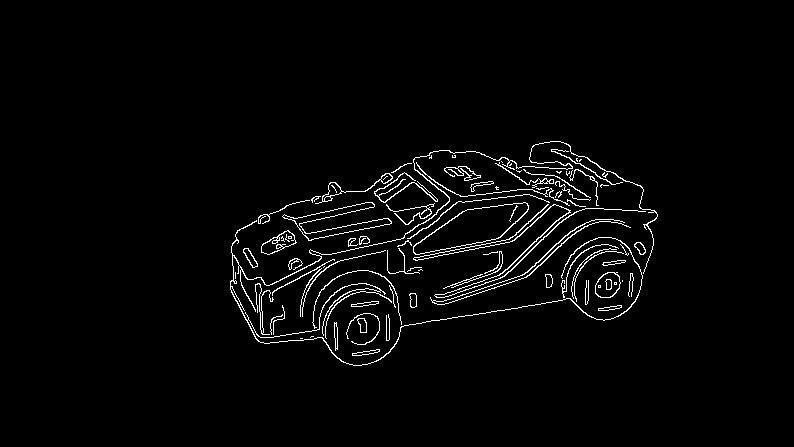

In [4]:
Image.open(output_path)

In [4]:
# import cv2
# import numpy as np
# from PIL import Image

# # Paths
# canny_path = "tpc_product_canny.png"
# output_mask_path = "reverse_mask.png"

# # Load Canny image (assumes edges are white on black)
# canny_img = cv2.imread(canny_path, cv2.IMREAD_GRAYSCALE)

# # Dilate edges to make closed contours (connect broken lines)
# kernel = np.ones((5, 5), np.uint8)
# dilated = cv2.dilate(canny_img, kernel, iterations=2)

# # Find contours from dilated edges
# contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# # Create a full white background (everything kept)
# mask = np.ones_like(canny_img, dtype=np.uint8) * 255

# # Fill the inside of detected object (inpainting region) with black
# cv2.drawContours(mask, contours, -1, 0, thickness=cv2.FILLED)

# # Save and preview
# Image.fromarray(mask).save(output_mask_path)
# print(f"Reverse inpainting mask saved to: {output_mask_path}")
# Image.open(output_mask_path)

import cv2
import numpy as np
from PIL import Image
 
# Paths
canny_path = "tpc_product_canny.png"
output_mask_path = "reverse_mask.png"
 
# Load Canny image (grayscale)
canny_img = cv2.imread(canny_path, cv2.IMREAD_GRAYSCALE)
 
# Dilate edges to connect broken lines
kernel = np.ones((5, 5), np.uint8)
dilated = cv2.dilate(canny_img, kernel, iterations=2)
 
# Find all contours
contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
 
# Create full white mask (default: all masked/inpainted)
mask = np.ones_like(canny_img, dtype=np.uint8) * 255
 
# Identify the largest contour (assumed to be product)
largest_contour = max(contours, key=cv2.contourArea)
 
# Fill product region with black (do not inpaint)
cv2.drawContours(mask, [largest_contour], -1, 0, thickness=cv2.FILLED)
 
# Smooth transition if needed
# mask = cv2.GaussianBlur(mask, (5, 5), 0)
 
# Save and show
Image.fromarray(mask).save(output_mask_path)
print(f"Reverse inpainting mask saved to: {output_mask_path}")






Reverse inpainting mask saved to: reverse_mask.png


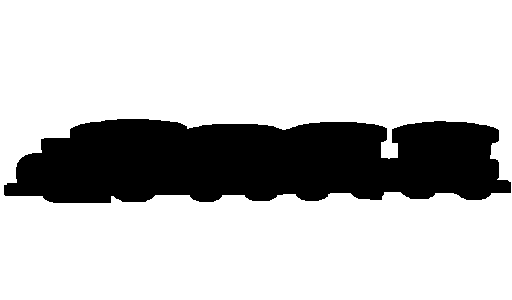

In [5]:
display(Image.open(output_mask_path))

In [7]:
from PIL import Image
import numpy as np

# Path to the input image
img_path = "/mnt/batch/tasks/shared/LS_root/mounts/clusters/gpu-image-gen/code/Users/atharva.jakhetiya/training_images/car-2.png"  # Replace with your actual image path

# Load the image and convert to RGB
original = Image.open(img_path).convert("RGB")
img_np = np.array(original)

# Threshold to determine if a pixel is white
threshold = 240  # You can tweak this based on your image's background tone

# Create a binary mask:
# - White pixels (all RGB > threshold) → keep white (255)
# - Other pixels (colored) → set to black (0)
white_mask = np.all(img_np > threshold, axis=-1)
mask = np.where(white_mask[..., None], 255, 0).astype(np.uint8)

# Convert to grayscale image
mask_img = Image.fromarray(mask.squeeze(), mode="L")

# Save the mask
mask_img.save("color_based_mask.png")
print("Saved mask to color_based_mask.png")


Saved mask to color_based_mask.png


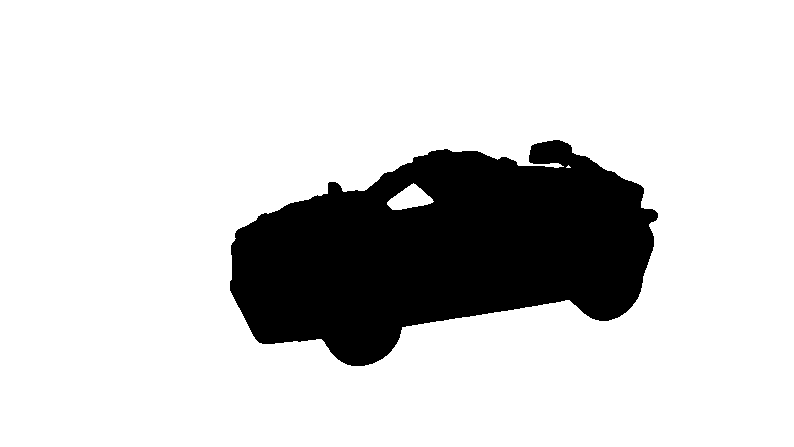

In [8]:
display(Image.open("color_based_mask.png"))

✅ Final refined mask saved: object_black_mask_fully_refined.png


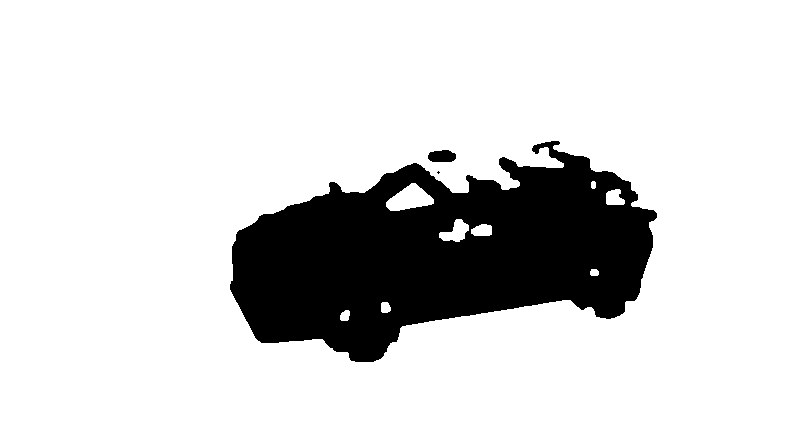

In [5]:
from PIL import Image
import numpy as np
from scipy.ndimage import binary_opening, binary_closing, gaussian_filter
 
# Step 1: Load and preprocess image
img_path = "training_images/car-2.png"
original = Image.open(img_path).convert("RGB")
# original = original.resize((1024, 1024))
img_np = np.array(original)
 
# Step 2: Compute brightness and contrast per pixel
brightness = img_np.mean(axis=-1)
contrast = img_np.max(axis=-1) - img_np.min(axis=-1)
 
# Step 3: Create rough object mask
# Loosen thresholds to include more object parts, exclude shadows
initial_mask = (brightness < 200) & (contrast > 10)
 
# Step 4: Optional closing to fill small internal holes
initial_mask = binary_closing(initial_mask, structure=np.ones((3, 3)))
 
# Step 5: Further morphological refinement
# - Opening removes small shadow speckles
# - Closing fills any remaining object holes
refined_mask = binary_opening(initial_mask, structure=np.ones((3, 3)))
refined_mask = binary_closing(refined_mask, structure=np.ones((5, 5)))
 
# Step 6: Smooth edges with Gaussian blur and re-binarize
smoothed = gaussian_filter(refined_mask.astype(float), sigma=1)
final_binary = (smoothed > 0.5).astype(np.uint8) * 255
 
# Step 7: Invert — object = 0 (black), background = 255 (white)
final_binary = 255 - final_binary
 
# Step 8: Save final mask
final_mask_img = Image.fromarray(final_binary, mode="L")
final_mask_img.save("object_black_mask_fully_refined.png")
print("✅ Final refined mask saved: object_black_mask_fully_refined.png")
display(final_mask_img)

100%|██████████| 50/50 [01:06<00:00,  1.33s/it]


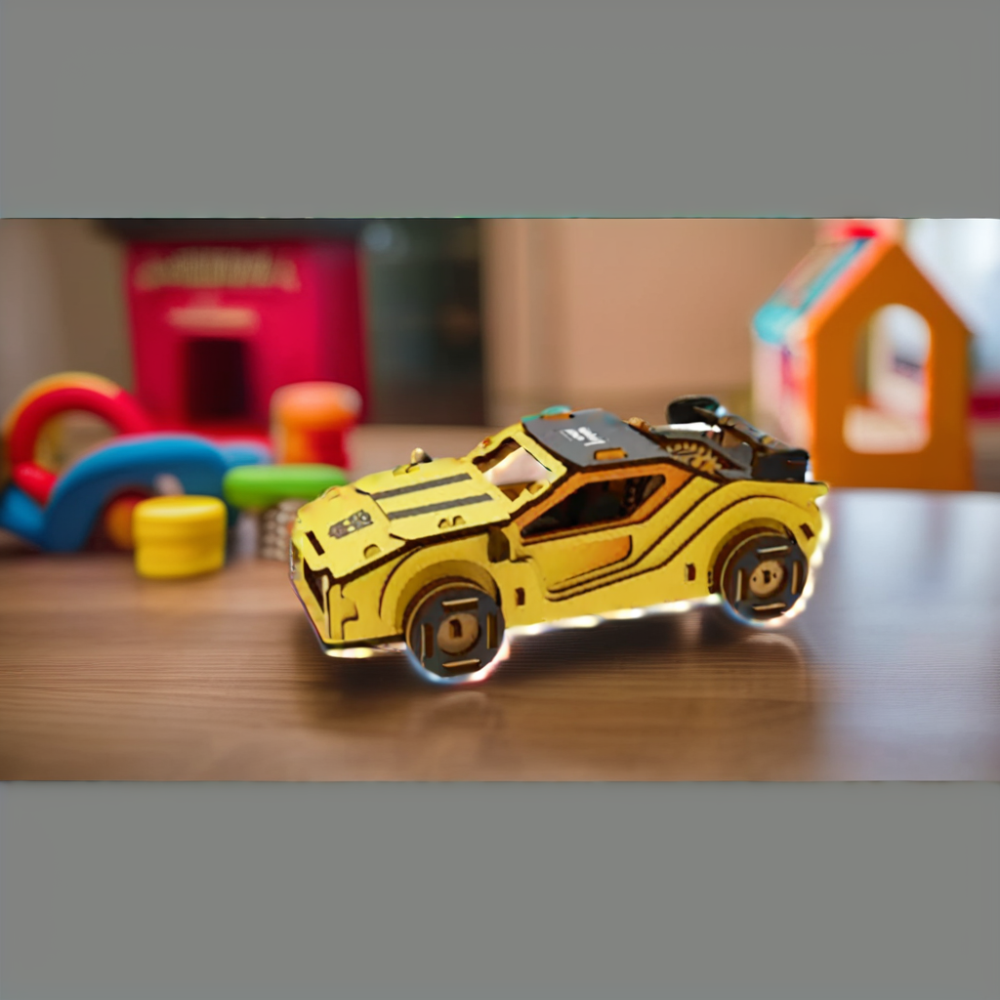

/usr/bin/xdg-open: 882: www-browser: not found
/usr/bin/xdg-open: 882: links2: not found
/usr/bin/xdg-open: 882: elinks: not found
/usr/bin/xdg-open: 882: links: not found
/usr/bin/xdg-open: 882: lynx: not found
/usr/bin/xdg-open: 882: w3m: not found
xdg-open: no method available for opening '/tmp/tmp8xc5gtqf.PNG'


In [11]:
# Currently Running
from diffusers import StableDiffusionXLControlNetInpaintPipeline, ControlNetModel, AutoencoderKL
from PIL import Image, ImageOps
import numpy as np
import cv2
import torch

# 🧼 Feathering the mask to prevent hard object-background separation
def feather_mask(pil_mask, blur_radius=25):
    mask_np = np.array(pil_mask)
    blurred = cv2.GaussianBlur(mask_np, (blur_radius, blur_radius), 0)
    return Image.fromarray(blurred)

# 🟫 Pad to 1024x1024 with neutral color (not white!)
def pad_to_square(img, size=1024, fill=(127, 127, 127)):
    old_size = img.size
    ratio = float(size) / max(old_size)
    new_size = tuple([int(x * ratio) for x in old_size])
    img = img.resize(new_size, Image.LANCZOS)
    delta_w = size - new_size[0]
    delta_h = size - new_size[1]
    padding = (delta_w // 2, delta_h // 2, delta_w - delta_w // 2, delta_h - delta_h // 2)
    return ImageOps.expand(img, padding, fill=fill)

# 🔽 Load and process images
# original_image = pad_to_square(Image.open("training_images/train.png").convert("RGB"), fill=(127,127,127))
# control_image = pad_to_square(Image.open("tpc_product_canny.png").convert("RGB"), fill=(127,127,127))
# raw_mask = Image.open("reverse_mask.png").convert("L")
# mask_image = feather_mask(pad_to_square(raw_mask, fill=0), blur_radius=25)
# original_image = Image.open("training_images/train.png")
# control_image = Image.open("tpc_product_canny.png")
# raw_mask = Image.open("reverse_mask.png")
# 🔽 Load and process images

# original_image = pad_to_square(Image.open("training_images/car-2.png").convert("RGB").resize((1024,1024)), fill=(127,127,127))
original_image = pad_to_square(Image.open("training_images/car-2.png").convert("RGB"), fill=(127,127,127))

control_image = pad_to_square(Image.open("tpc_product_canny.png").convert("RGB"), fill=(127,127,127))
raw_mask = Image.open("color_based_mask.png")
mask_image = feather_mask(pad_to_square(raw_mask, fill=0))

# 🎛️ Load ControlNet and pipeline
controlnet = ControlNetModel.from_pretrained("diffusers/controlnet-canny-sdxl-1.0", torch_dtype=torch.float16)
vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16)

pipe = StableDiffusionXLControlNetInpaintPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    controlnet=controlnet,
    vae=vae,
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True,
)
pipe.to("cuda")
pipe.enable_attention_slicing()

# ✍️ Prompt
prompt = (
    "a toy car with wheels placed on a colorful children's play table in a cozy playroom, toys, bookshelves, and playful decorations in the background, "
    "soft indoor lighting, natural shadows, realistic reflections, highly detailed, ultra photorealistic, cinematic quality"
)


negative_prompt = (
    "overflowing white pixels, padding or white pixels,blurry, distorted, artifacts, white border, harsh edges, empty background, unrealistic"
)

# 🖼️ Generate result
result = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    image=original_image,
    mask_image=mask_image,
    control_image=control_image,
    num_inference_steps=50,
    guidance_scale=8.5,
    controlnet_conditioning_scale=0.85,
    strength=1.0,
)

# 💾 Save
result.images[0].save("final_output_clean.png")
result.images[0].show()
display(result.images[0])

In [16]:
import cv2
import numpy as np
from PIL import Image, ImageOps
import torch
from diffusers import StableDiffusionXLControlNetInpaintPipeline, ControlNetModel, AutoencoderKL

# === 1. PAD FUNCTION ===
def pad_to_square(img, size=1024, fill=(0, 0, 0)):
    old_size = img.size
    ratio = float(size) / max(old_size)
    new_size = tuple([int(x * ratio) for x in old_size])
    img = img.resize(new_size, Image.LANCZOS)
    delta_w = size - new_size[0]
    delta_h = size - new_size[1]
    padding = (delta_w // 2, delta_h // 2, delta_w - delta_w // 2, delta_h - delta_h // 2)

    # 🛠 Fix: convert fill for grayscale images (mode "L")
    fill_color = fill
    if img.mode == "L" and isinstance(fill, tuple):
        fill_color = fill[0]

    return ImageOps.expand(img, padding, fill=fill_color)


# === 2. REVERSE MASK FROM CANNY ===
def create_soft_reverse_mask(canny_path):
    canny_img = cv2.imread(canny_path, cv2.IMREAD_GRAYSCALE)
    kernel = np.ones((5, 5), np.uint8)
    dilated = cv2.dilate(canny_img, kernel, iterations=2)
    contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    mask = np.ones_like(canny_img, dtype=np.uint8) * 255
    cv2.drawContours(mask, contours, -1, 0, thickness=cv2.FILLED)
    feathered = cv2.GaussianBlur(mask, (51, 51), 0)
    return Image.fromarray(feathered)

# === 3. Load images ===
original_image = pad_to_square(Image.open("training_images/pimage.png").convert("RGB"))
control_image = pad_to_square(Image.open("tpc_product_canny.png").convert("RGB"))
mask_image = pad_to_square(create_soft_reverse_mask("reverse_mask.png").convert("L"))

# === 4. Load pipeline ===
controlnet = ControlNetModel.from_pretrained(
    "diffusers/controlnet-canny-sdxl-1.0", torch_dtype=torch.float16
)
vae = AutoencoderKL.from_pretrained(
    "madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16
)
pipe = StableDiffusionXLControlNetInpaintPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    controlnet=controlnet,
    vae=vae,
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True,
).to("cuda")
pipe.enable_attention_slicing()

# === 5. Prompt ===
prompt = (
    "a yellow wooden toy car placed on a table in a study room with books and decor items in the background, "
    "realistic lighting, soft shadow, ultra photorealistic"
)
negative_prompt = (
    "white outline, edge glow, blurry, distorted, unrealistic, artifacts"
)

# === 6. Run inpainting ===
result = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    image=original_image,
    mask_image=mask_image,
    control_image=control_image,
    num_inference_steps=50,
    guidance_scale=7.5,
    controlnet_conditioning_scale=0.85,
)

# === 7. Save Result ===
result.images[0].save("final_output.png")

display(result.images[0])


FileNotFoundError: [Errno 2] No such file or directory: 'training_images/pimage.png'

100%|██████████| 50/50 [01:04<00:00,  1.29s/it]


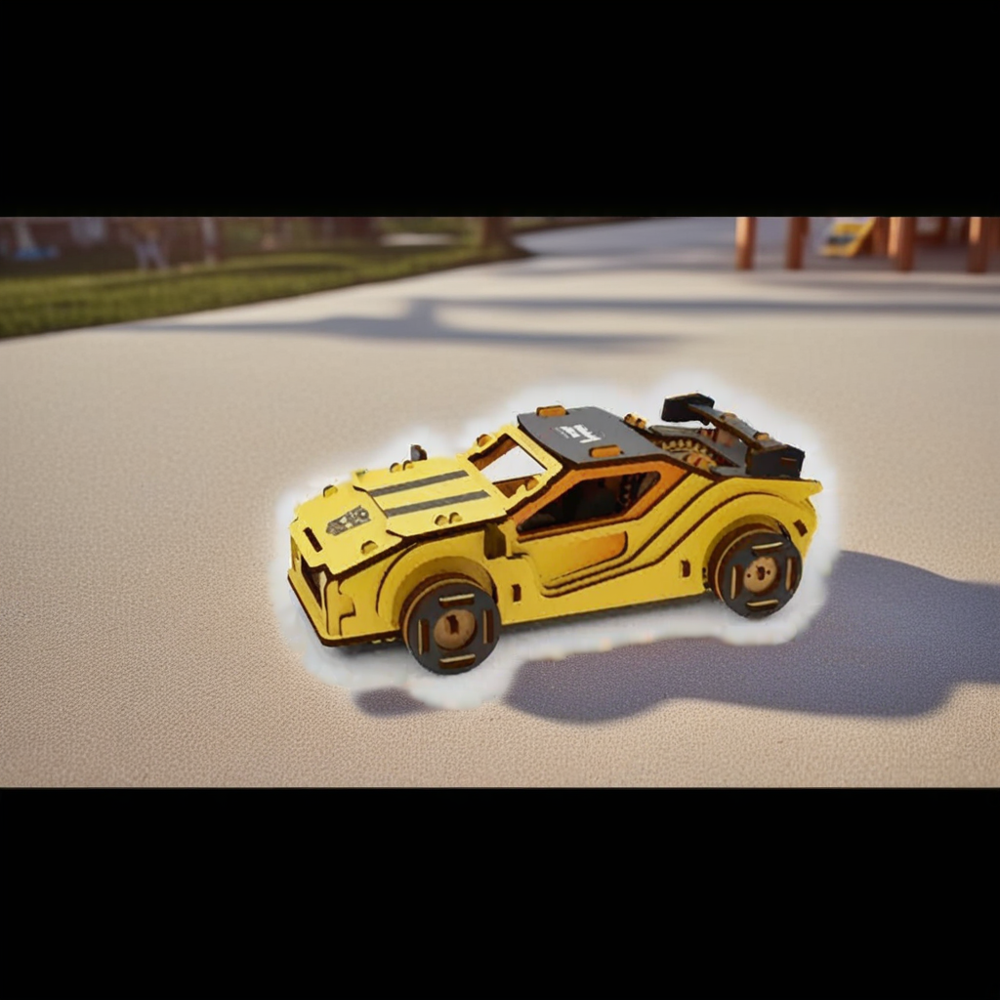

In [10]:
# from diffusers import StableDiffusionXLControlNetInpaintPipeline, ControlNetModel, AutoencoderKL
# from diffusers.utils import load_image
# from PIL import Image
# from PIL import ImageOps
# import torch


# # Load all components
# def pad_to_square(img, size=1024, fill=(0, 0, 0)):
#     old_size = img.size
#     ratio = float(size) / max(old_size)
#     new_size = tuple([int(x * ratio) for x in old_size])
#     img = img.resize(new_size, Image.LANCZOS)
#     delta_w = size - new_size[0]
#     delta_h = size - new_size[1]
#     padding = (delta_w // 2, delta_h // 2, delta_w - delta_w // 2, delta_h - delta_h // 2)
#     return ImageOps.expand(img, padding, fill=fill)

# # 🔽 PAD IMAGES HERE (before using them in pipeline)
# original_image = pad_to_square(Image.open("training_images/pimage.png").convert("RGB"))
# control_image = pad_to_square(Image.open("tpc_product_canny.png").convert("RGB"))
# mask_image = pad_to_square(Image.open("reverse_mask.png").convert("L"), fill=(0,)) # Optional, some pipelines just use the mask

# # Load ControlNet
# controlnet = ControlNetModel.from_pretrained(
#     "diffusers/controlnet-canny-sdxl-1.0",
#     torch_dtype=torch.float16
# )

# # Load optional VAE
# vae = AutoencoderKL.from_pretrained(
#     "madebyollin/sdxl-vae-fp16-fix",
#     torch_dtype=torch.float16
# )

# # Load pipeline
# pipe = StableDiffusionXLControlNetInpaintPipeline.from_pretrained(
#     "stabilityai/stable-diffusion-xl-base-1.0",
#     controlnet=controlnet,
#     vae=vae,
#     torch_dtype=torch.float16,
#     variant="fp16",
#     use_safetensors=True
# )

# pipe.to("cuda")
# pipe.enable_attention_slicing()

# # Prompt
# prompt = (
#     "a yellow wooden toy car placed on the ground in a children's playground during golden hour, "
#     "warm sunlight, soft natural shadows, playground equipment in the background, trees, sand, "
#     "realistic lighting, highly detailed, ultra photorealistic, cinematic quality"
# )

# negative_prompt = (
#     "low quality, blurry, distorted, deformed, unrealistic, empty background, artifacts,blur background"
# )


# # Run the pipeline
# result = pipe(
#     prompt=prompt,
#     negative_prompt=negative_prompt,
#     image=original_image,
#     mask_image=mask_image,
#     control_image=control_image,
#     num_inference_steps=50,
#     guidance_scale=7.5,
#     strength=1.0,
#     controlnet_conditioning_scale=0.85
# )

# # Show image in notebook
# result.images[0].save("final_output.png")
# display(result.images[0])

100%|██████████| 50/50 [01:05<00:00,  1.31s/it]


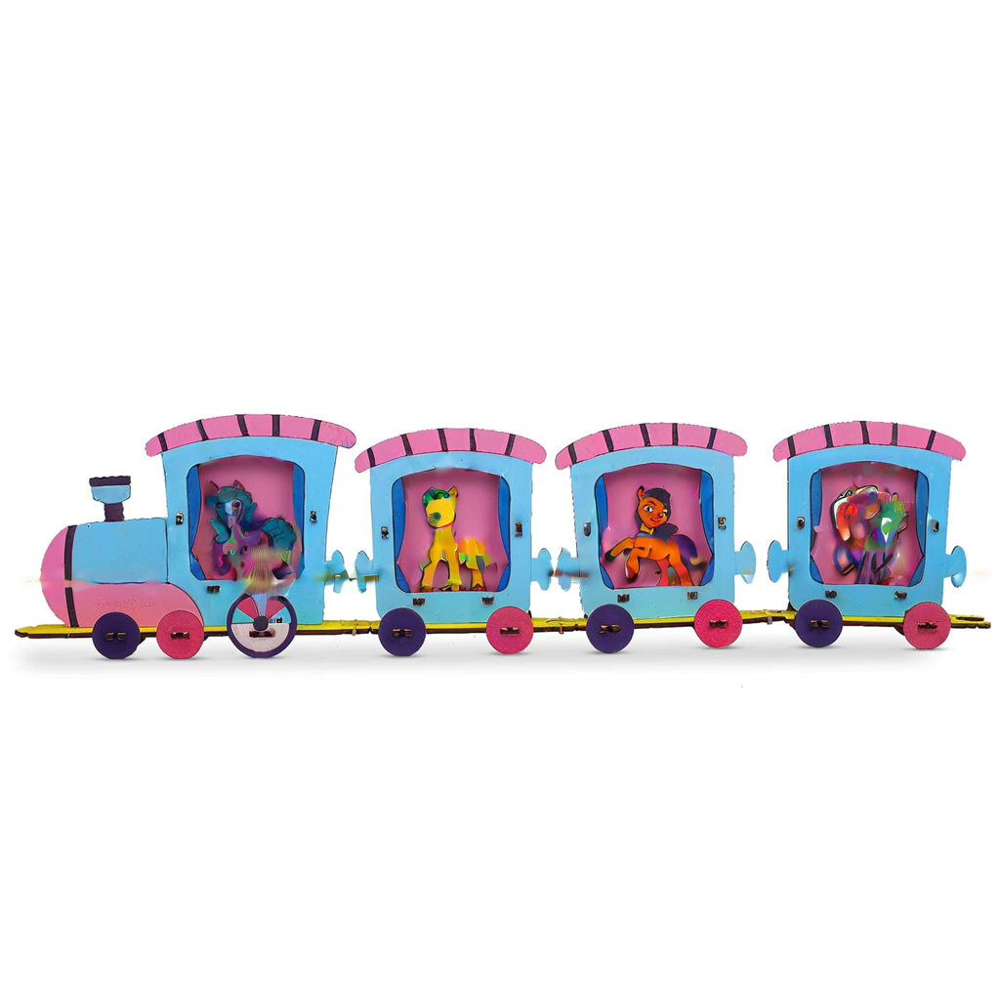

/usr/bin/xdg-open: 882: www-browser: not found
/usr/bin/xdg-open: 882: links2: not found
/usr/bin/xdg-open: 882: elinks: not found
/usr/bin/xdg-open: 882: links: not found
/usr/bin/xdg-open: 882: lynx: not found
/usr/bin/xdg-open: 882: w3m: not found
xdg-open: no method available for opening '/tmp/tmpbulctsw3.PNG'


In [2]:
from diffusers import StableDiffusionXLControlNetInpaintPipeline, ControlNetModel, AutoencoderKL
from PIL import Image, ImageOps
import numpy as np
import cv2
import torch

# 🧼 Feathering the mask to prevent hard object-background separation
def feather_mask(pil_mask, blur_radius=25):
    mask_np = np.array(pil_mask)
    blurred = cv2.GaussianBlur(mask_np, (blur_radius, blur_radius), 0)
    return Image.fromarray(blurred)

# 🟫 Pad to 1024x1024 with neutral color (not white!)
def pad_to_square(img, size=1024, fill=(127, 127, 127)):
    old_size = img.size
    ratio = float(size) / max(old_size)
    new_size = tuple([int(x * ratio) for x in old_size])
    img = img.resize(new_size, Image.LANCZOS)
    delta_w = size - new_size[0]
    delta_h = size - new_size[1]
    padding = (delta_w // 2, delta_h // 2, delta_w - delta_w // 2, delta_h - delta_h // 2)
    return ImageOps.expand(img, padding, fill=fill)

# 🔽 Load and process images
# original_image = pad_to_square(Image.open("training_images/train.png").convert("RGB"), fill=(127,127,127))
# control_image = pad_to_square(Image.open("tpc_product_canny.png").convert("RGB"), fill=(127,127,127))
# raw_mask = Image.open("reverse_mask.png").convert("L")
# mask_image = feather_mask(pad_to_square(raw_mask, fill=0), blur_radius=25)
# original_image = Image.open("training_images/train.png")
# control_image = Image.open("tpc_product_canny.png")
# raw_mask = Image.open("reverse_mask.png")
# 🔽 Load and process images
original_image = pad_to_square(Image.open("training_images/train.png").convert("RGB"), fill=(127,127,127))
control_image = pad_to_square(Image.open("tpc_product_canny.png").convert("RGB"), fill=(127,127,127))
raw_mask = Image.open("reverse_mask.png")
mask_image = feather_mask(pad_to_square(raw_mask, fill=0))

# 🎛️ Load ControlNet and pipeline
controlnet = ControlNetModel.from_pretrained("diffusers/controlnet-canny-sdxl-1.0", torch_dtype=torch.float16)
vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16)

pipe = StableDiffusionXLControlNetInpaintPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    controlnet=controlnet,
    vae=vae,
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True,
)
pipe.to("cuda")
pipe.enable_attention_slicing()

# ✍️ Prompt
prompt = (
    "a wooden train placed on a colorful children's play table in a cozy playroom, toys, bookshelves, and playful decorations in the background, "
    "soft indoor lighting, natural shadows, realistic reflections, highly detailed, ultra photorealistic, cinematic quality"
)


negative_prompt = (
    "padding or white pixels,blurry, distorted, artifacts, white border, harsh edges, empty background, unrealistic"
)

# 🖼️ Generate result
result = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    image=original_image,
    mask_image=mask_image,
    control_image=control_image,
    num_inference_steps=50,
    guidance_scale=8.5,
    controlnet_conditioning_scale=0.85,
    strength=1.0,
)

# 💾 Save
result.images[0].save("final_output_clean.png")
result.images[0].show()
display(result.images[0])


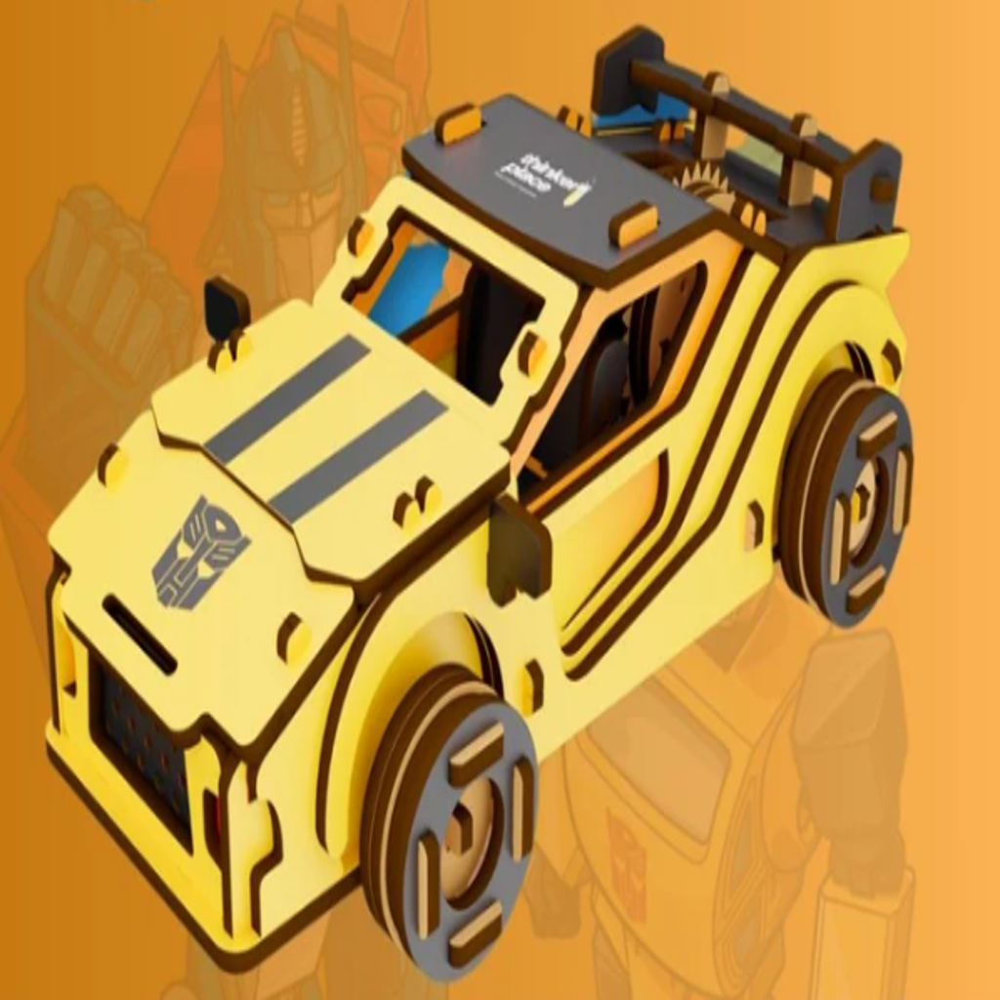

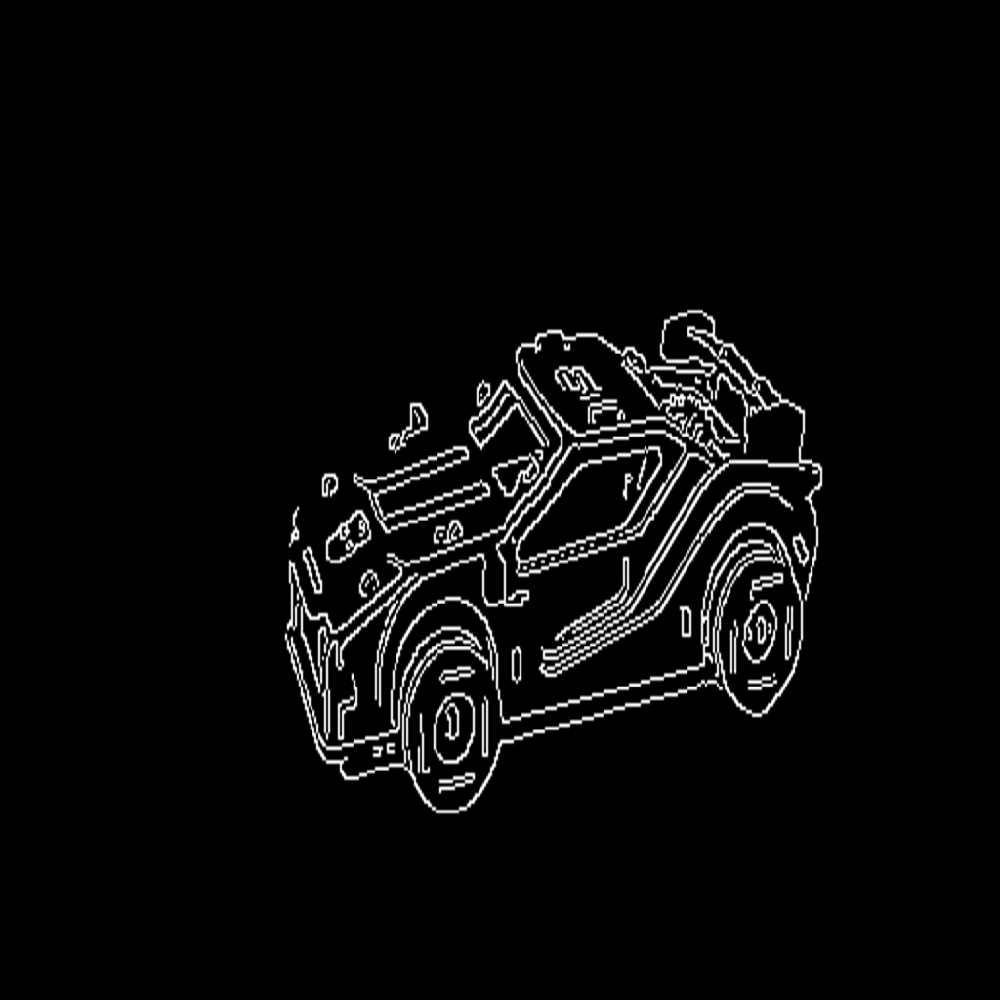

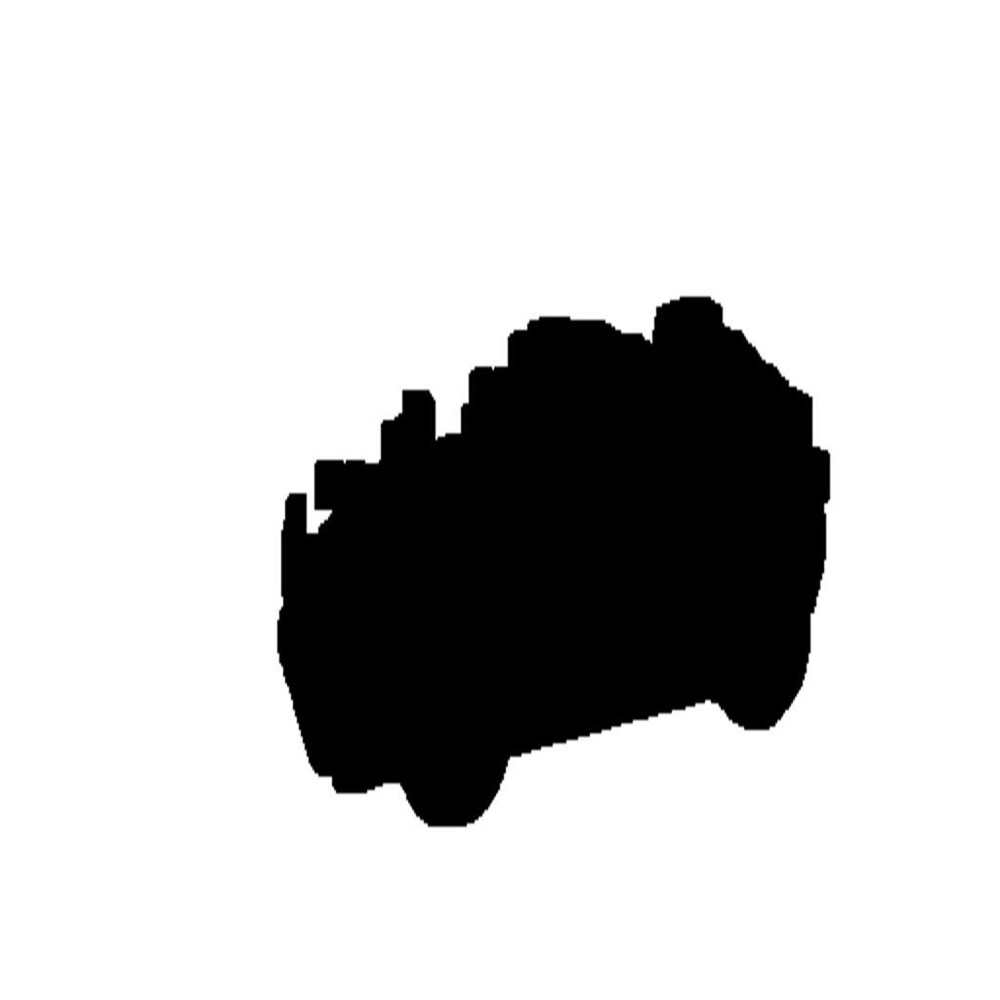

In [20]:
display(original_image)        # Must be clear, object centered
display(control_image)         # Should show clean Canny edges
display(mask_image)   


In [23]:
from diffusers import (
    StableDiffusionXLControlNetPipeline,
    ControlNetModel,
    AutoencoderKL,
    EulerDiscreteScheduler,
)
from diffusers.utils import load_image
import torch
from PIL import Image

# Load your Canny edge image (already resized to 1024x1024)
control_image = load_image("tpc_product_canny.png")

# Load ControlNet pretrained on Canny
controlnet = ControlNetModel.from_pretrained(
    "diffusers/controlnet-canny-sdxl-1.0", torch_dtype=torch.float16)


OSError: diffusers/controlnet-normal-sdxl-1.0 is not a local folder and is not a valid model identifier listed on 'https://huggingface.co/models'
If this is a private repository, make sure to pass a token having permission to this repo with `token` or log in with `huggingface-cli login`.

Keyword arguments {'image': <PIL.Image.Image image mode=RGB size=1024x1024 at 0x752BB930F0D0>, 'height': 1024, 'width': 1024} are not expected by StableDiffusionXLControlNetPipeline and will be ignored.
100%|██████████| 50/50 [00:14<00:00,  3.48it/s]


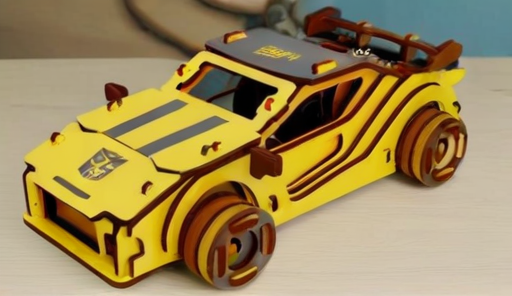

In [6]:
from diffusers import (
    StableDiffusionXLControlNetPipeline,
    ControlNetModel,
    AutoencoderKL,
    EulerDiscreteScheduler,
)

# Load your Canny edge image (already resized to 1024x1024)
control_image = load_image("tpc_product_canny.png")

vae = AutoencoderKL.from_pretrained(
    "madebyollin/sdxl-vae-fp16-fix", 
    torch_dtype=torch.float16)

# Load SDXL base pipeline
pipe = StableDiffusionXLControlNetPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    controlnet=controlnet,
    torch_dtype=torch.float16,
    image=control_image.resize((1024, 1024)), 
    height=1024,  # match control image
    width=1024,
    vae=vae,
    variant="fp16",
    use_safetensors=True
)

# Load your LoRA fine-tuned weights
pipe.load_lora_weights(
    "sdxl-lora-output",  # your LoRA directory
    weight_name="pytorch_lora_weights.safetensors",
    local_files_only=True
)

pipe.enable_attention_slicing()
pipe.to("cuda")

# Prompt
prompt = "a photo of tpc product on the beach ,should look real ,ultra realistic,highly detailed,natural background"
negative_prompt = (
    "real car, blurry, distorted child, adult, multiple products, cartoon, 3d render, text, extra limbs, low resolution"
)

# Generate image
image = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    image=control_image,
    height=300,
    width=512,
    num_inference_steps=50,
    controlnet_conditioning_scale=1.0,  # can reduce to 0.5 if too strong
    
).images[0]

# Save and display
image.save("output_with_controlnet.png")

display(image)

/anaconda/envs/azureml_py310_sdkv2/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
100%|██████████| 50/50 [00:47<00:00,  1.06it/s]


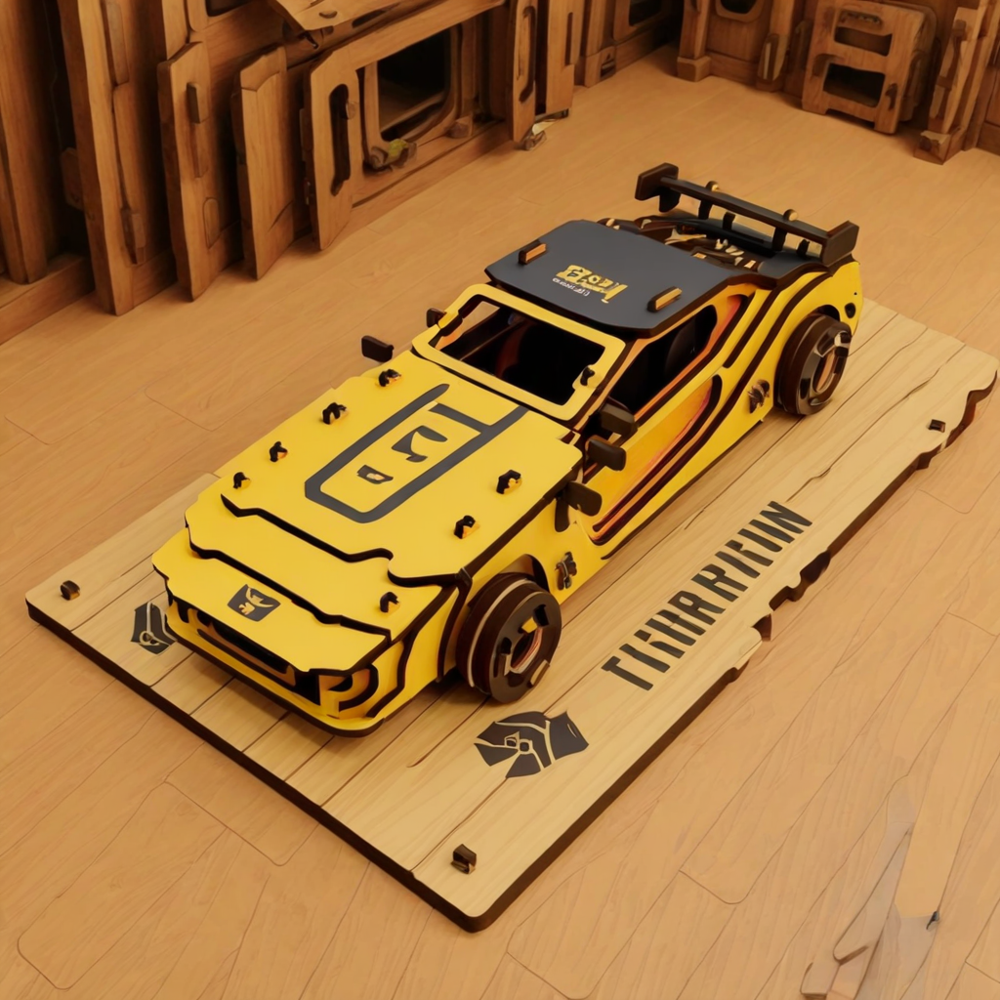

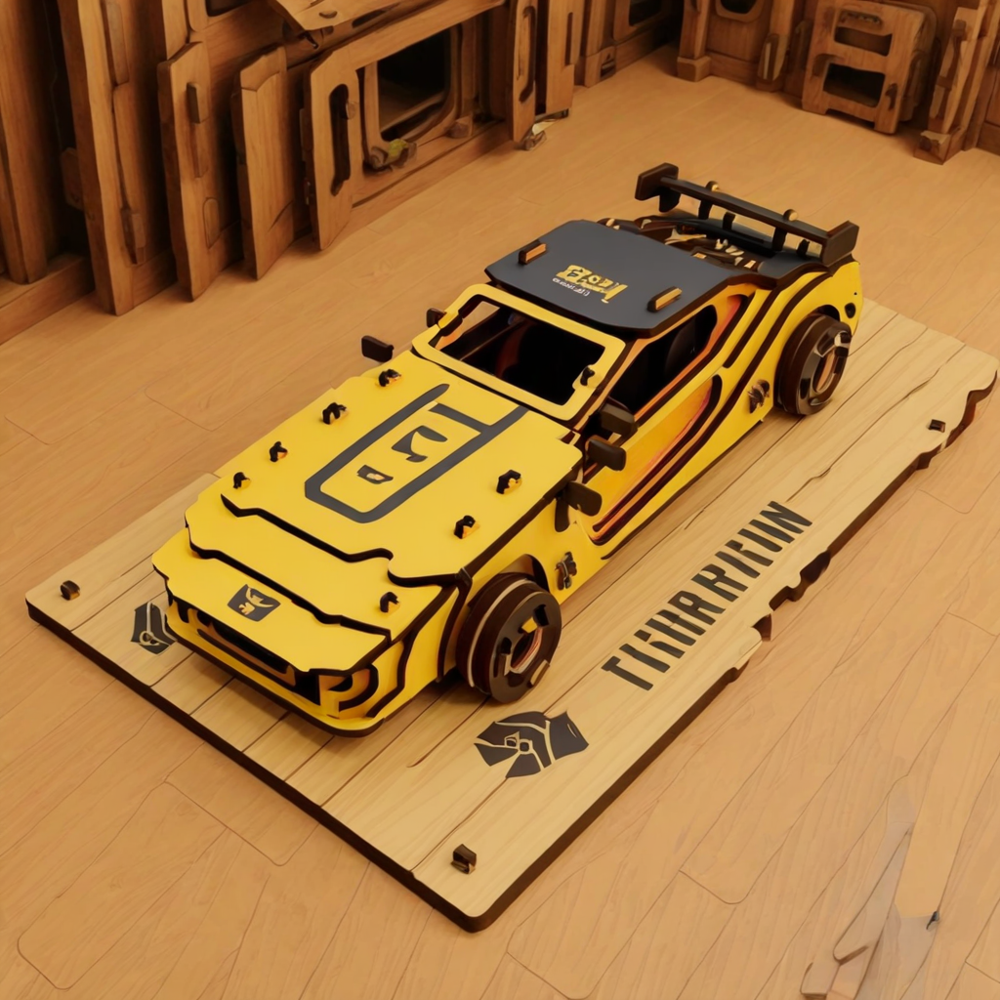

In [1]:
from diffusers import StableDiffusionXLPipeline, EulerDiscreteScheduler
import torch

# Load base model
pipe = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True
).to("cuda")

# Load LoRA weights
# pipe.load_lora_weights(
#     "sdxl-lora-output",
#     weight_name="pytorch_lora_weights.safetensors",
#     local_files_only=True
# )
pipe.load_lora_weights(
    "sdxl-lora-output",
    weight_name="pytorch_lora_weights.safetensors",
    local_files_only=True
)

# Enable attention slicing to save memory
pipe.enable_attention_slicing()

# Generate an image
# prompt = "a photo of tpc product in a natural setting ,child playing with it and is heldheld size,,high quality,on a beach with clear beach background ,clean edges ,with sleek body adorned with mesmerizing, creating a stunning visual effect"
# negative_prompt = "blurring,no distortion,no more than one product"
prompt = "a photo of tpc product on the wooden floor , ultra realistic "


negative_prompt = (
    "real car, blurry, distorted child, adult, multiple products, multiple cars, cartoon, 3d render, illustration, "
    "text, watermark, extra limbs, abstract elements, low resolution, low quality, shadows missing, overexposed"
)




image = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    num_inference_steps=50
).images[0]


# Save or show
image.save("lora_output.png")
display(image)

100%|██████████| 50/50 [00:48<00:00,  1.02it/s]


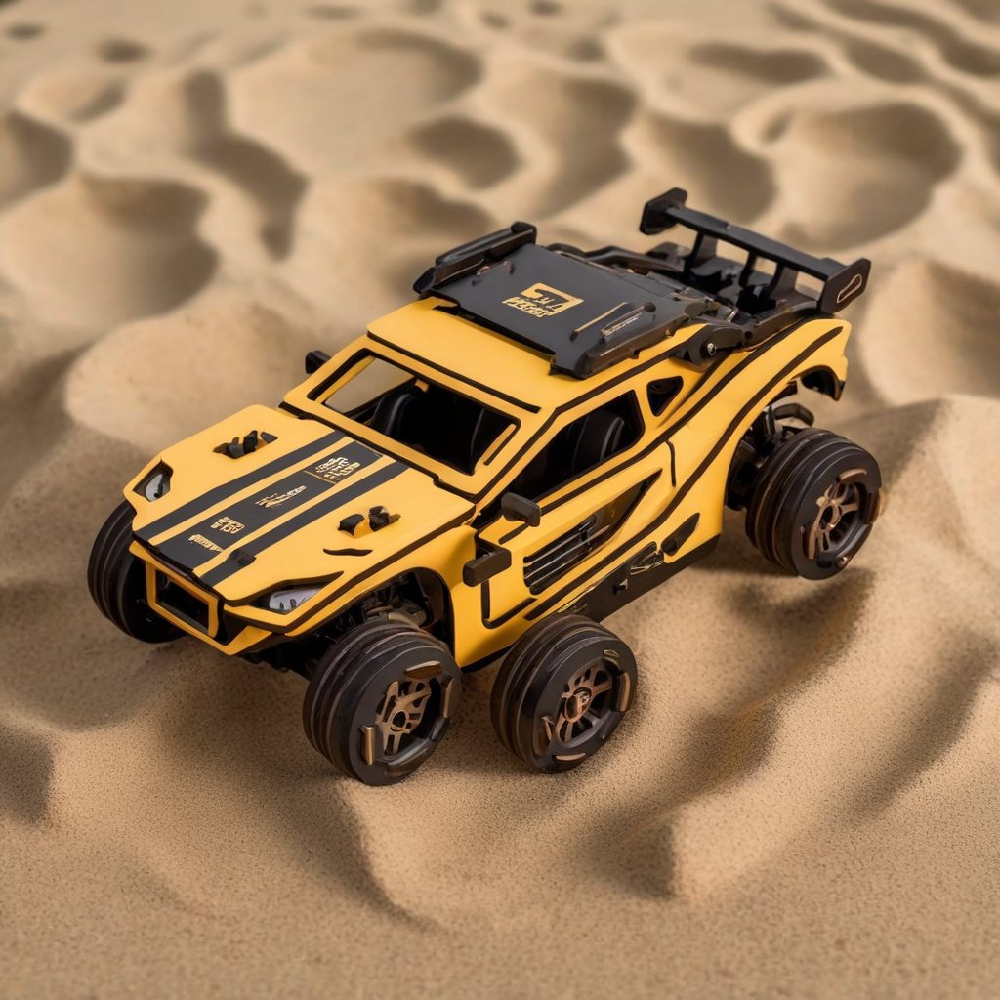

In [4]:
from diffusers import StableDiffusionXLPipeline, EulerDiscreteScheduler
import torch

# Load base model
pipe = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True
).to("cuda")

# Load LoRA weights
pipe.load_lora_weights("./sdxl-lora-output")

# Enable attention slicing to save memory
pipe.enable_attention_slicing()

# Generate an image
prompt = (
    "a photo of tpc product, handheld-sized realistic toy car, placed on a sunlit beach, "
    "a lifelike child playing with it joyfully, natural daylight, realistic shadows, high-resolution, "
    "studio-quality, shallow depth of field, clean sandy background, sharp details, professional photography style"
)
negative_prompt = (
    "real car, blurry, distorted child, adult, multiple products, multiple cars, cartoon, 3d render, illustration, "
    "text, watermark, extra limbs, abstract elements, low resolution, low quality, shadows missing, overexposed"
)




image = pipe(prompt=prompt,negative_prompt=negative_prompt, num_inference_steps=50).images[0]

# Save or show
image.save("lora_output.png")
display(image)


In [6]:
from PIL import Image
import numpy as np
from diffusers import StableDiffusionXLInpaintPipeline,DiffusionPipeline
import torch

# Load inpainting pipeline
pipe = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True
).to("cuda")

# Load LoRA weights
pipe.load_lora_weights("./sdxl-lora-output")

# Enable memory optimization
pipe.enable_attention_slicing()

Loading pipeline components...: 100%|██████████| 7/7 [00:00<00:00, 10.06it/s]


100%|██████████| 50/50 [00:47<00:00,  1.05it/s]


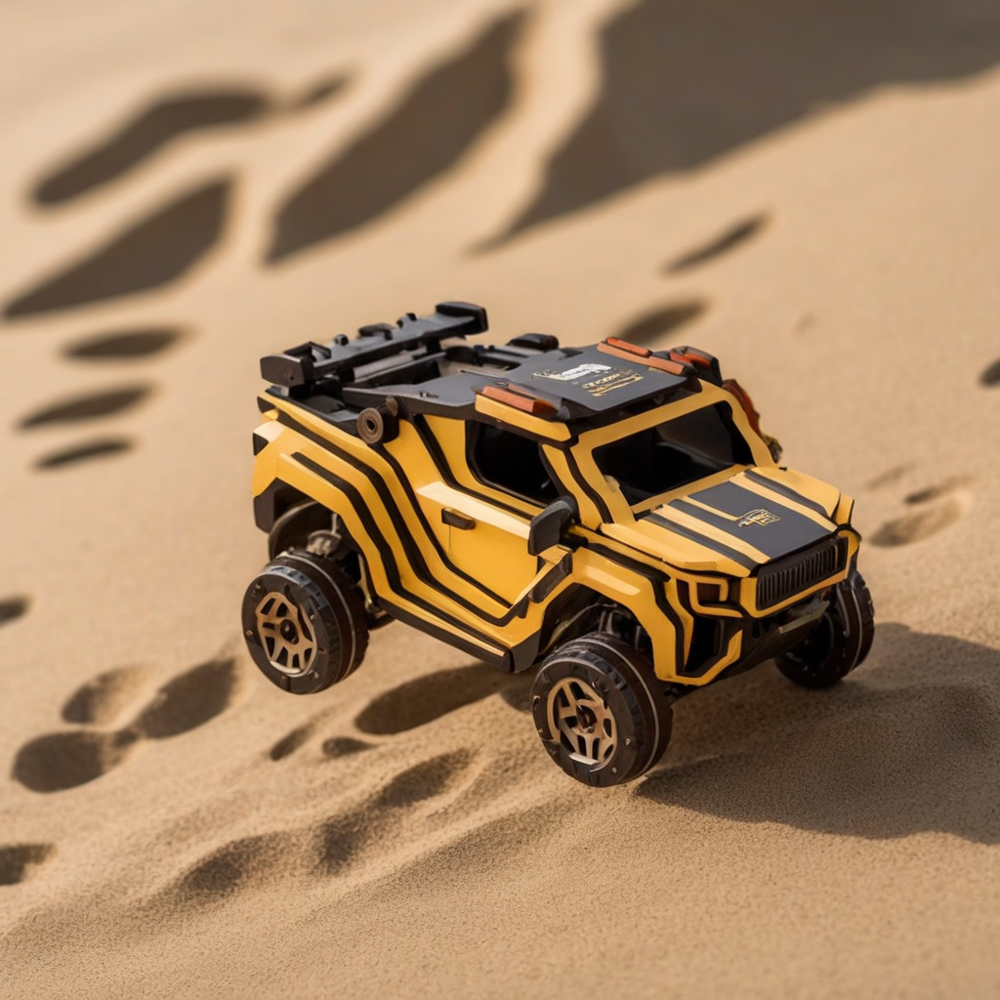

In [7]:
mask_image = Image.new("L", (512,512), color=255)  # 255 = white

# Save it for reuse
mask_image.save("inpaint_mask.png")

# Load your base image
image = Image.open("output_with_controlnet.png").convert("RGB")

# Load or create a binary mask (white = editable area, black = keep as is)
mask_image = Image.open("inpaint_mask.png").convert("L")  # grayscale mask

# prompt = "a photo of tpc product where a realistic child is playing with the tpc product on a beach, handheld small toy car, natural lighting, joyful,ultra realistic,highly detailed"
# negative_prompt = "real car, blurry, distorted child, adult, multiple products,multiple cars, cartoon, illustration, text, watermark,multiple limbs"

prompt = (
    "a photo of tpc product, handheld-sized realistic toy car, placed on a sunlit beach, "
    "a lifelike child playing with it joyfully, natural daylight, realistic shadows, high-resolution, "
    "studio-quality, shallow depth of field, clean sandy background, sharp details, professional photography style"
)
negative_prompt = (
    "real car, blurry, distorted child, adult, multiple products, multiple cars, cartoon, 3d render, illustration, "
    "text, watermark, extra limbs, abstract elements, low resolution, low quality, shadows missing, overexposed"
)


output = pipe(
    prompt=prompt,
    negative_prompt=negative_prompt,
    image=image,
    mask_image=mask_image,
    num_inference_steps=50,
).images[0]

output.save("inpainted_output.png")
display(output)

In [6]:
import os

print(os.getcwd())  # Where your script is currently looking



/mnt/batch/tasks/shared/LS_root/mounts/clusters/shivaylumacompute/code/Users/shivay.bhargava


In [9]:
print(os.listdir("/mnt/batch/tasks/shared/LS_root/mounts/clusters/shivaylumacompute/code/Users/shivay.bhargava/sdxl-lora-output"))


FileNotFoundError: [Errno 2] No such file or directory: '/mnt/batch/tasks/shared/LS_root/mounts/clusters/shivaylumacompute/code/Users/shivay.bhargava/sdxl-lora-output'

In [11]:
!unzip -o sdxl-lora-output.zip



unzip:  cannot find or open sdxl-lora-output.zip, sdxl-lora-output.zip.zip or sdxl-lora-output.zip.ZIP.


In [12]:
import os
os.listdir()


['.amlignore',
 '.amlignore.amltmp',
 '.ipynb_aml_checkpoints',
 'imagegen.ipynb',
 'imagegen.ipynb.amltmp',
 'LUMA']

In [13]:
%cd diffusers

[Errno 2] No such file or directory: 'diffusers'
/mnt/batch/tasks/shared/LS_root/mounts/clusters/shivaylumacompute/code/Users/shivay.bhargava


In [16]:
import os
print("Current Working Dir:", os.getcwd())
print("Files here:", os.listdir('LUMA'))

Current Working Dir: /mnt/batch/tasks/shared/LS_root/mounts/clusters/shivaylumacompute/code/Users/shivay.bhargava
Files here: ['.amlignore', '.amlignore.amltmp', '.ipynb_aml_checkpoints', 'diffusers', 'inpainted_output.png', 'inpaint_mask.png', 'lora_output.png', 'sdxl-lora-output', 'sdxl-lora-output.zip', 'sdxl.ipynb', 'sdxl.ipynb.amltmp', 'training_images']


In [17]:
!unzip -o LUMA/sdxl-lora-output.zip -d .


Archive:  LUMA/sdxl-lora-output.zip
   creating: ./sdxl-lora-output/
  inflating: ./sdxl-lora-output/.amlignore  
  inflating: ./sdxl-lora-output/.amlignore.amltmp  
   creating: ./sdxl-lora-output/checkpoint-1000/
  inflating: ./sdxl-lora-output/checkpoint-1000/optimizer.bin  
  inflating: ./sdxl-lora-output/checkpoint-1000/pytorch_lora_weights.safetensors  
  inflating: ./sdxl-lora-output/checkpoint-1000/random_states_0.pkl  
  inflating: ./sdxl-lora-output/checkpoint-1000/scaler.pt  
  inflating: ./sdxl-lora-output/checkpoint-1000/scheduler.bin  
   creating: ./sdxl-lora-output/checkpoint-500/
  inflating: ./sdxl-lora-output/checkpoint-500/optimizer.bin  
  inflating: ./sdxl-lora-output/checkpoint-500/pytorch_lora_weights.safetensors  
  inflating: ./sdxl-lora-output/checkpoint-500/random_states_0.pkl  
  inflating: ./sdxl-lora-output/checkpoint-500/scaler.pt  
  inflating: ./sdxl-lora-output/checkpoint-500/scheduler.bin  
   creating: ./sdxl-lora-output/logs/
   creating: ./sdxl-lo

In [11]:
pip install urllib3==1.26.20

  Attempting uninstall: urllib3
    Found existing installation: urllib3 2.4.0
    Uninstalling urllib3-2.4.0:
      Successfully uninstalled urllib3-2.4.0
Note: you may need to restart the kernel to use updated packages.


In [2]:
from diffusers import (
    StableDiffusionXLControlNetPipeline,
    ControlNetModel,
    StableDiffusionXLControlNetImg2ImgPipeline,
    AutoencoderKL,
    EulerDiscreteScheduler,
)

In [1]:
import torch
import diffusers
import transformers
import PIL
import scipy
import numpy

print("torch:", torch.__version__)
print("diffusers:", diffusers.__version__)
print("transformers:", transformers.__version__)
print("Pillow:", PIL.__version__)
print("scipy:", scipy.__version__)
print("numpy:", numpy.__version__)

/anaconda/envs/azureml_py310_sdkv2/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


torch: 2.7.1+cu126
diffusers: 0.34.0
transformers: 4.53.1
Pillow: 11.3.0
scipy: 1.15.3
numpy: 1.26.4


In [2]:
!pip install opencv-python --upgrade


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 MB 8.5 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 4.11.0.86
    Uninstalling opencv-python-4.11.0.86:
      Successfully uninstalled opencv-python-4.11.0.86


In [4]:
import cv2
print("cv2 version:", cv2.__version__)

ModuleNotFoundError: No module named 'cv2'

In [5]:
import sys
print(sys.executable)


/anaconda/envs/azureml_py310_sdkv2/bin/python


In [6]:
import sys
!{sys.executable} -m pip install opencv-python --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 MB 30.4 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 MB 34.7 MB/s eta 0:00:0000:0100:01
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [opencv-python]0m [opencv-python]


In [7]:
pip install numpy==1.26.4

  Using cached numpy-1.26.4-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
Using cached numpy-1.26.4-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.2 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 2.2.6
    Uninstalling numpy-2.2.6:
      Successfully uninstalled numpy-2.2.6
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
opencv-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.4 which is incompatible.
Note: you may need to restart the kernel to use updated packages.


In [ ]:
!du -sh /* 2>/dev/null | sort -hr | head -n 20
